<a href="https://colab.research.google.com/github/klei22/nanoGPT/blob/master/Johnson_Lyndenstrauss_Lemma_Studies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Johnson Lyndenstrauss Lemma Studies

Visualizations of the Johnson-Lyndenstrauss Implications for high-dimensional vector space.

### Initialize Repo and Cd into Directory

In [ ]:
%cd /content
!git clone https://github.com/ReaLLMASIC/nanogpt
%cd nanogpt
%ls
%cd analysis/distillation
%ls
%pwd

/content
fatal: destination path 'nanogpt' already exists and is not an empty directory.
/content/nanogpt
analysis/                  huggingface_model/        run_exploration_monitor.py
baseline.yaml              HW/                       run_hp_search.sh
benchmarks/                hyperparam_search.py      sample.py
colabs/                    initializations/          shared_param_utils.py
create_new_exploration.sh  LICENSE                   tests/
data/                      logging/                  tf_np_golden_gen/
demos/                     model.py                  train_args.py
distillation/              optimization_and_search/  train.py
documentation/             quantization/             util_factorization/
explorations/              README.md                 utils/
exutorch/                  requirements_cpu.txt      variations/
gpt_conf.py                requirements_gpu.txt      view_hp_log.py
/content/nanogpt/analysis/distillation
comparison_of_log_regression_cuda.py  num

'/content/nanogpt/analysis/distillation'

In [ ]:
%ls
!python3 comparison_of_log_regression_cuda.py --regression log

angle_distribution_1024d_min_angle.png   angle_distribution_64d_min_angle.png
angle_distribution_1024d.npy             angle_distribution_64d.npy
angle_distribution_1024d_regression.png  angle_distribution_64d_regression.png
angle_distribution_128d_min_angle.png    angle_distribution_8d_min_angle.png
angle_distribution_128d.npy              angle_distribution_8d.npy
angle_distribution_128d_regression.png   angle_distribution_8d_regression.png
angle_distribution_16d_min_angle.png     angle_distribution_both_comparison.png
angle_distribution_16d.npy               comparison_of_log_regression_cuda.py
angle_distribution_16d_regression.png    comparison_of_log_regression.py
angle_distribution_256d_min_angle.png    hypersphere_shadow_packing.py
angle_distribution_256d.npy              images/
angle_distribution_256d_regression.png   jls_transform_analysis.py
angle_distribution_32d_min_angle.png     jlt.py
angle_distribution_32d.npy               numerical_minimum_calculation.py
angle_distrib

### Show Plots

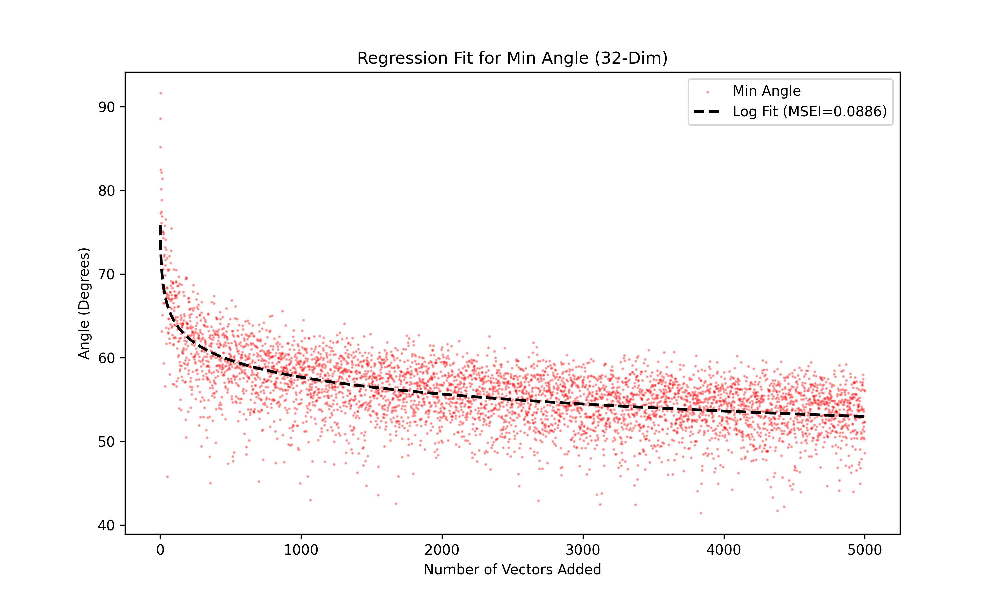

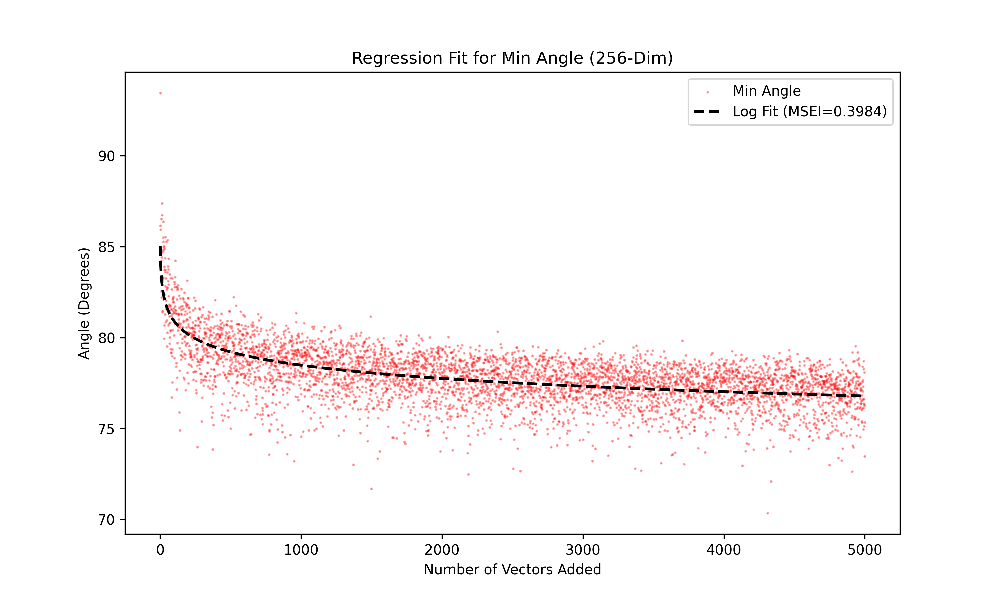

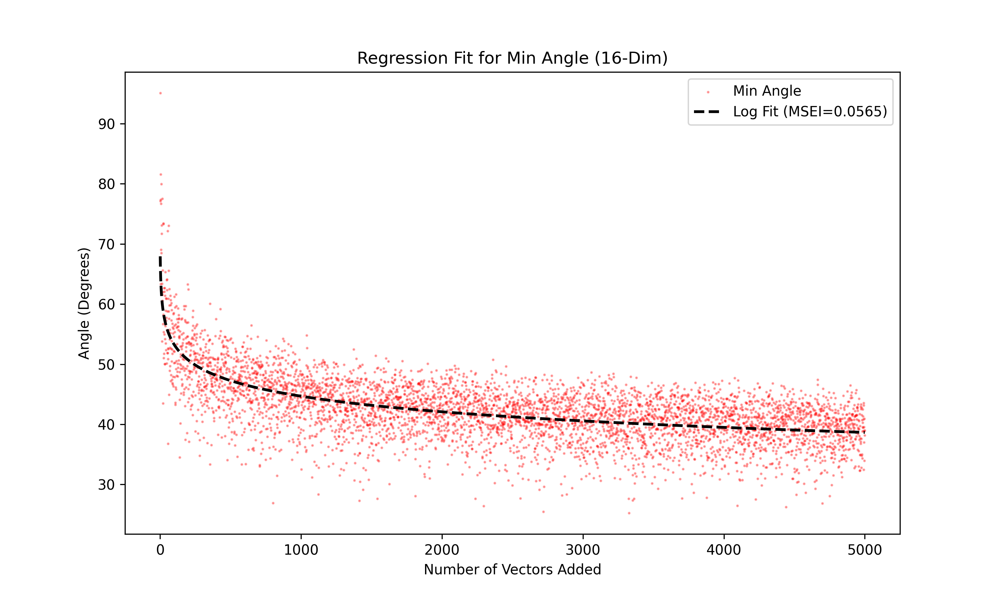

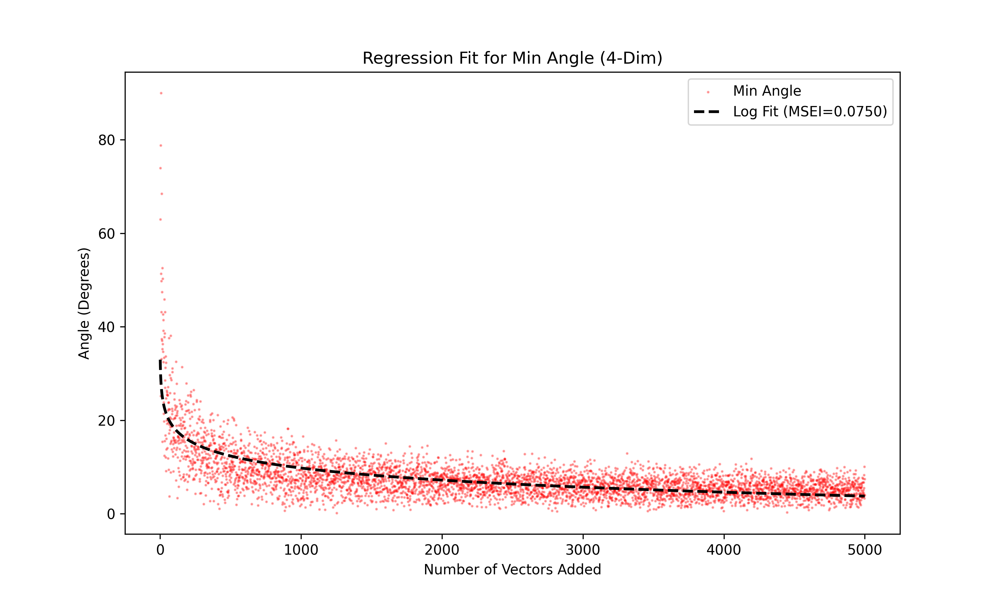

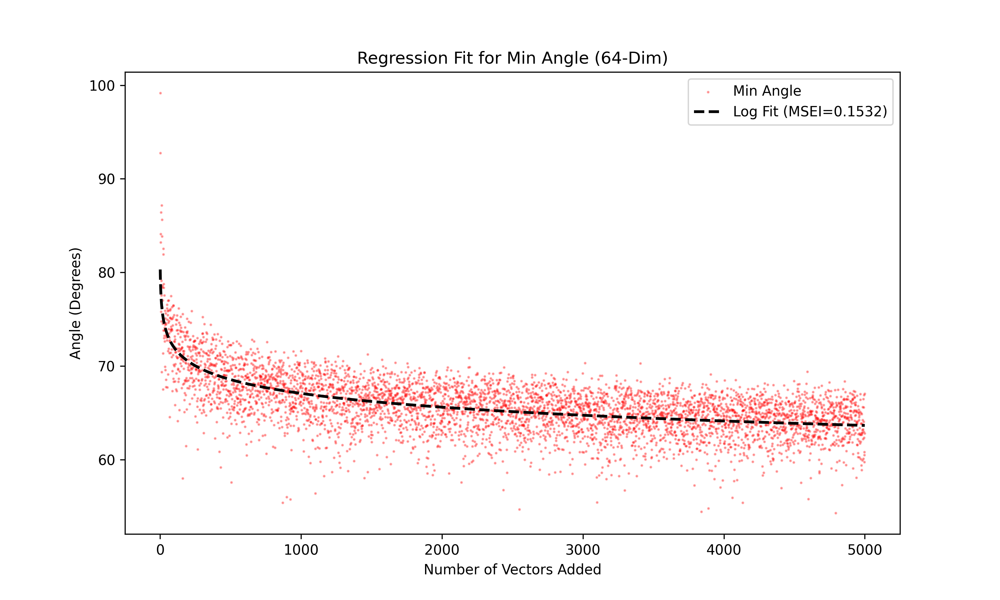

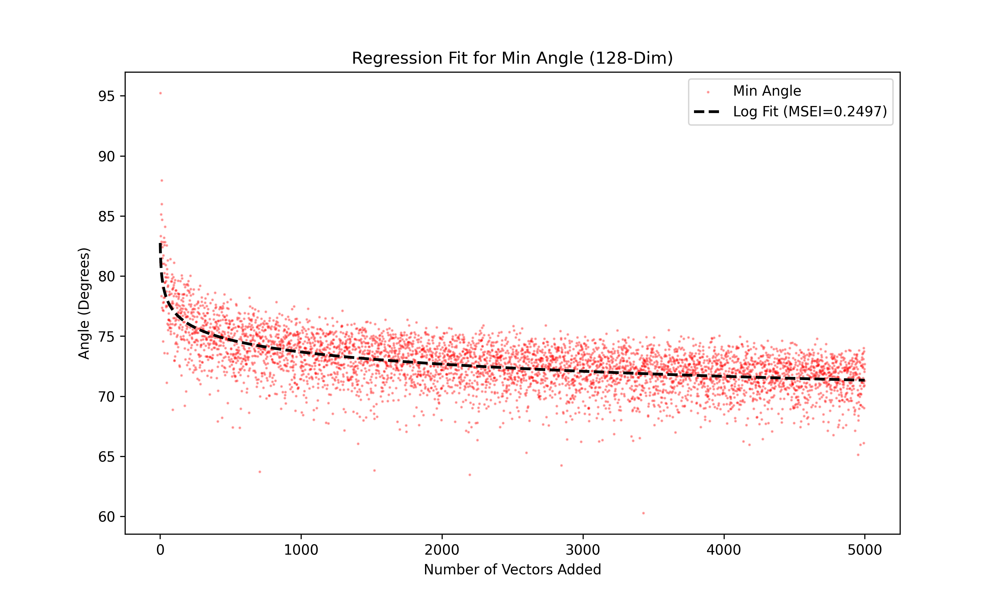

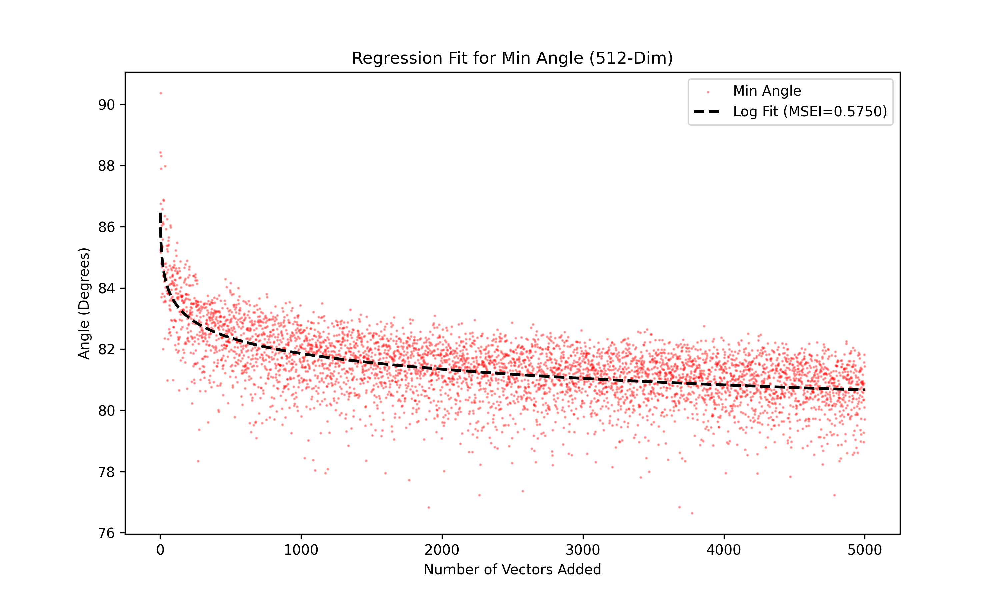

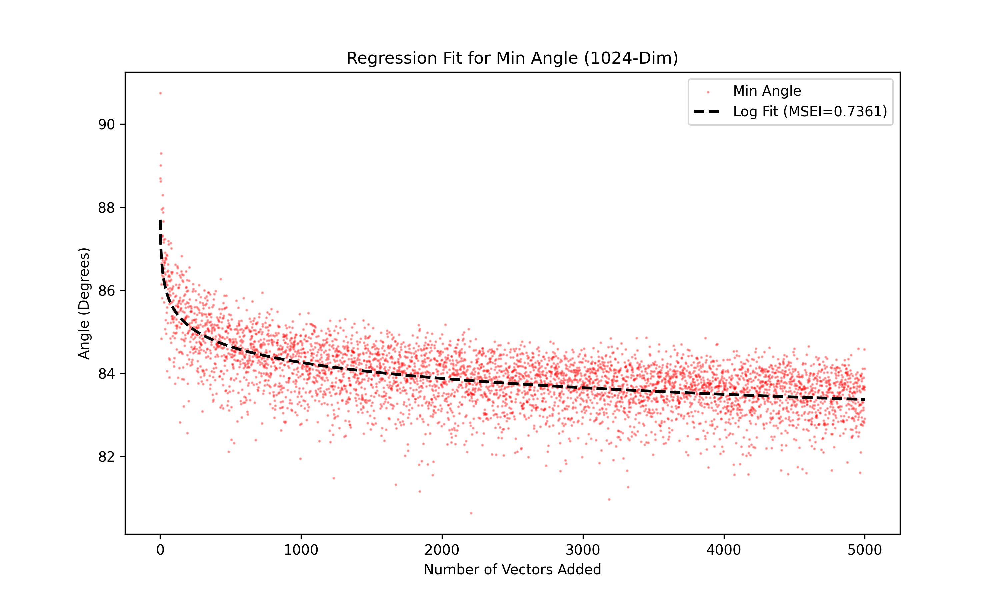

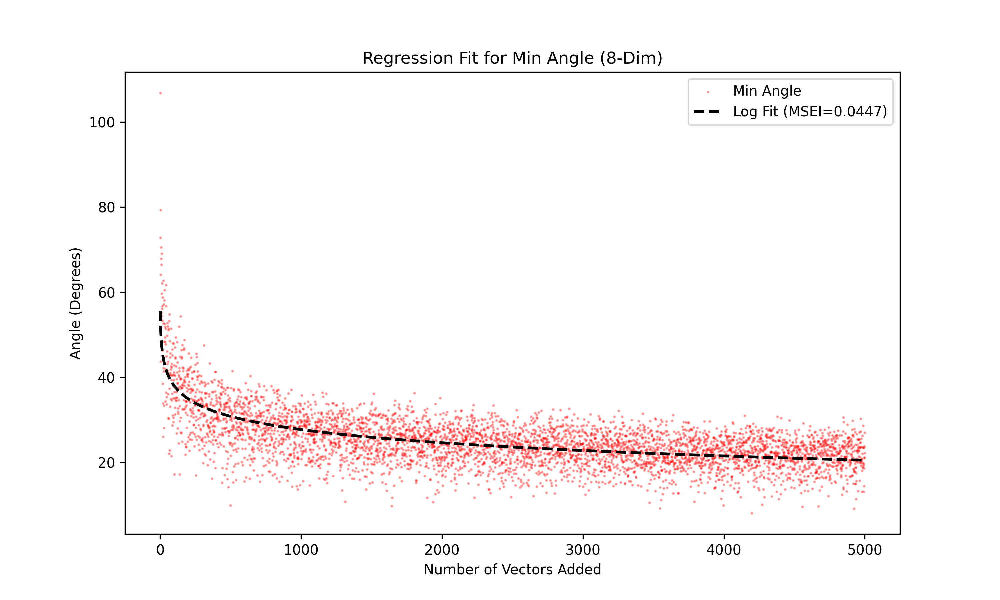

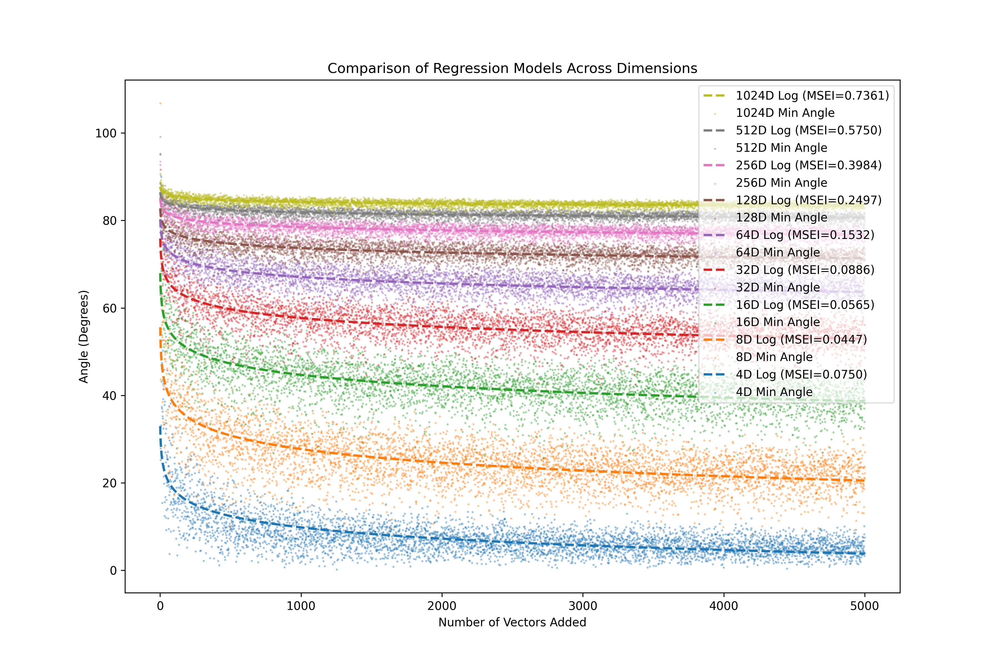

In [ ]:
import os, re
from IPython.display import display, Image

pattern = re.compile(r'.*\.(?:png|jpe?g)$', re.IGNORECASE)
exclude_re = re.compile(r'.*min_angle.*\.png$', re.IGNORECASE)

for fname in os.listdir('.'):
    if pattern.match(fname) and not exclude_re.match(fname):
        display(Image(filename=fname))


### Analysis of JL Transform Effectiveness

In [ ]:
!python3 jls_transform_analysis.py

=== Matrix * Matrix Analysis ===
Matrix 100x100: k from 10 to 100, final relative error: 1.0132
Matrix 200x200: k from 10 to 200, final relative error: 0.9972
Matrix 500x500: k from 10 to 500, final relative error: 1.0007
Matrix 1000x1000: k from 10 to 1000, final relative error: 1.0008
Figure(800x500)
Figure(800x500)

=== Vector * Matrix Analysis (Fixed Vector Size) ===
  k:  10, Relative error: 4.1366, Time: 0.000433s
  k:  35, Relative error: 3.4540, Time: 0.000667s
  k:  61, Relative error: 3.3514, Time: 0.000879s
  k:  87, Relative error: 2.4163, Time: 0.001130s
  k: 113, Relative error: 2.2796, Time: 0.001458s
  k: 138, Relative error: 1.9230, Time: 0.001661s
  k: 164, Relative error: 1.8858, Time: 0.001899s
  k: 190, Relative error: 1.8417, Time: 0.002268s
  k: 216, Relative error: 1.5771, Time: 0.002532s
  k: 242, Relative error: 1.4061, Time: 0.002899s
  k: 267, Relative error: 1.4445, Time: 0.003295s
  k: 293, Relative error: 1.3811, Time: 0.003515s
  k: 319, Relative error: 

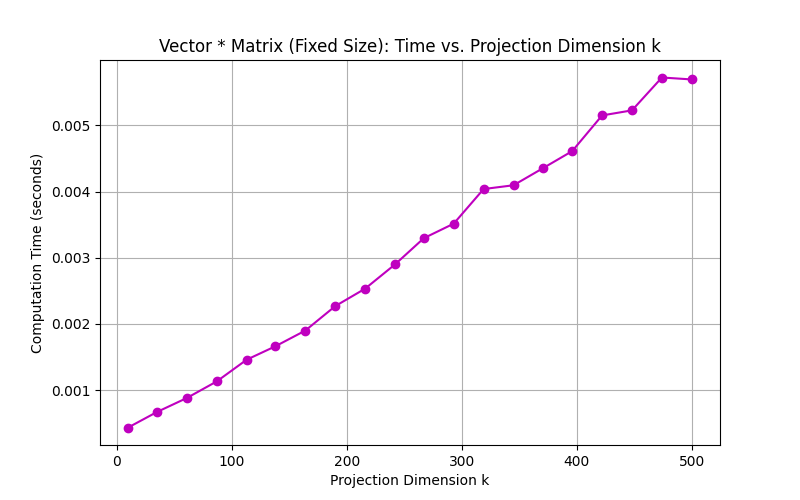

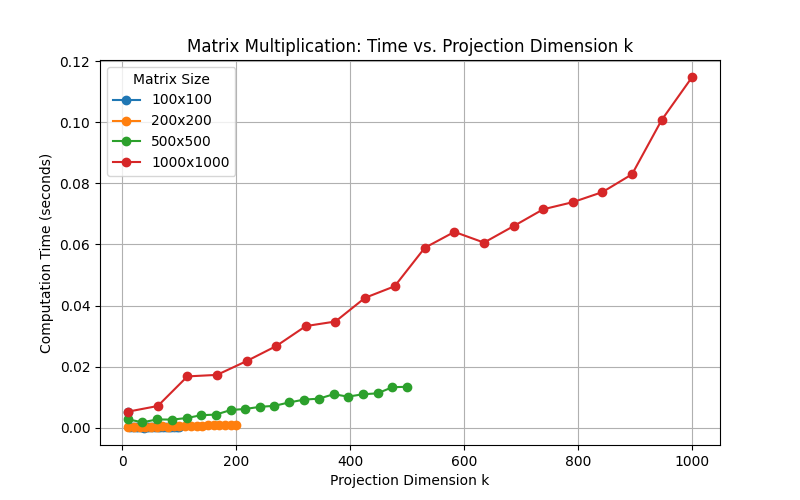

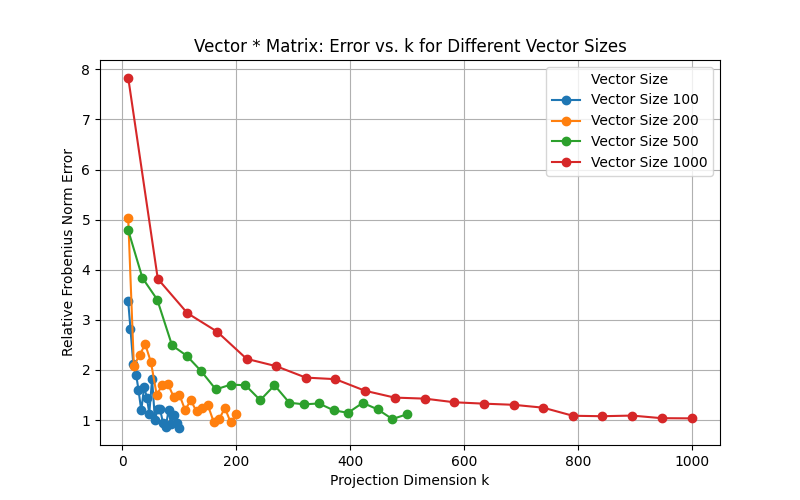

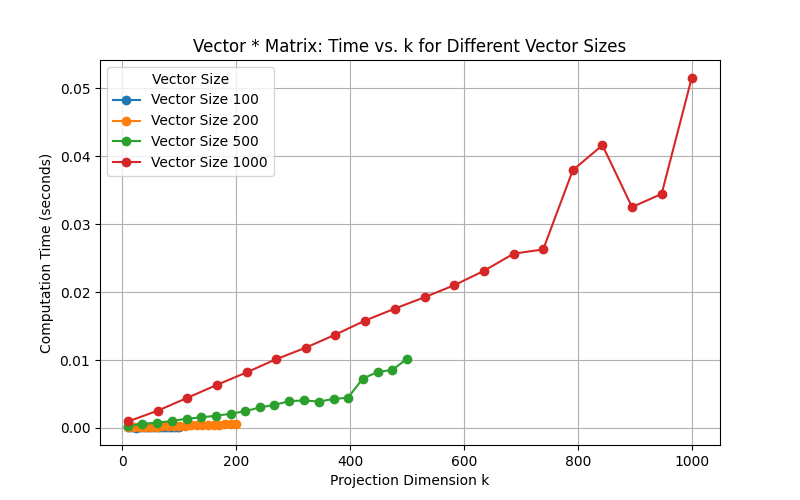

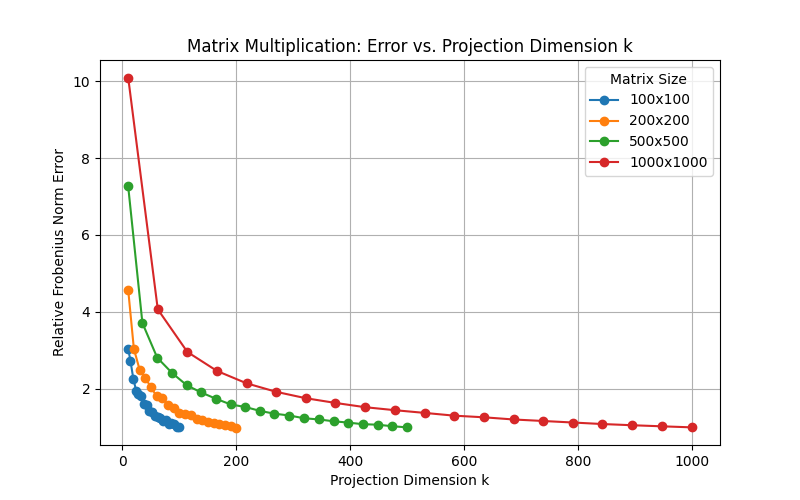

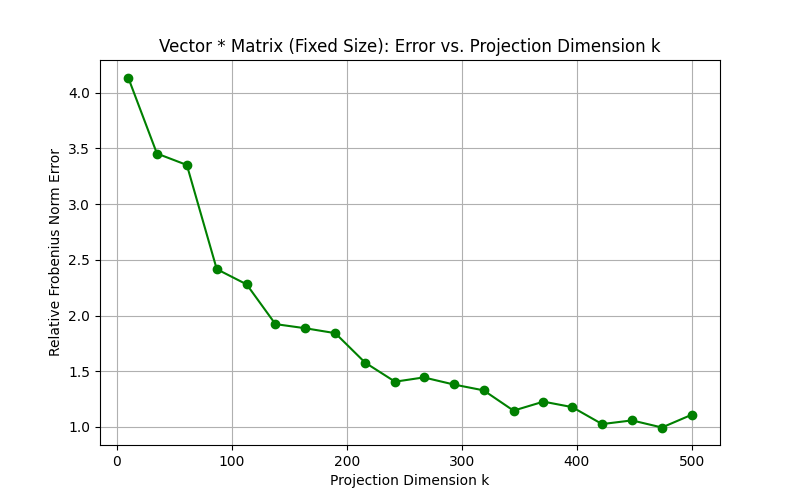

In [ ]:
import os, re
from IPython.display import display, Image

pattern = re.compile(r'jl.*\.(?:png|jpe?g)$', re.IGNORECASE)

for fname in os.listdir('.'):
    if pattern.match(fname) and not exclude_re.match(fname):
        display(Image(filename=fname))


### Scatter Plots

In [ ]:
!python3 numerical_minimum_calculation.py -n 1_000_000 -dps 20 -p 1024

Integrating: 100% 2/2 [01:50<00:00, 55.12s/interval]

Numerically calculated expected minimum angle (n=1000000, p=1024, dps=20): 81.303552237999403819 degrees


In [ ]:
!python3 numerical_minimum_calculation.py -n 1_000_000 -dps 9 -p 1024

Integrating: 100% 2/2 [00:19<00:00,  9.57s/interval]

Numerically calculated expected minimum angle (n=1000000, p=1024, dps=9): 128.278935 degrees


In [ ]:
!python3 numerical_minimum_calculation.py -n 1_000_000 -dps 10 -p 1024

Integrating: 100% 2/2 [00:19<00:00,  9.62s/interval]

Numerically calculated expected minimum angle (n=1000000, p=1024, dps=10): 128.2789353 degrees


**bold text**### FP16 vs BF16

<ipython-input-1-976374f09160>:61: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.94])


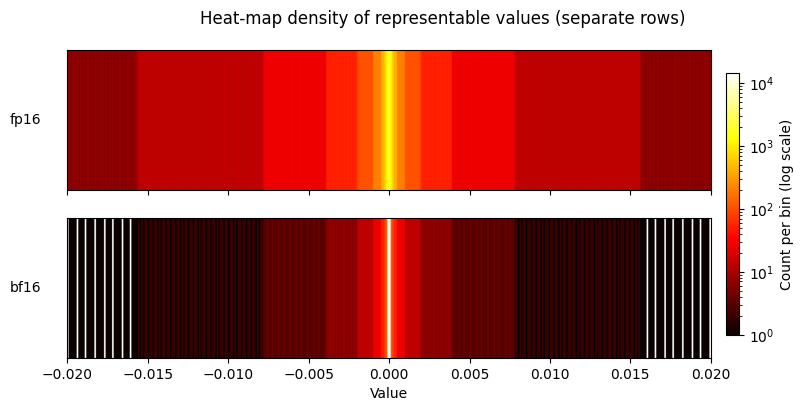

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors

# interval and resolution
low, high = -0.02, 0.02
bins = 400

def bf16_to_float32(bf):
    return (bf.astype(np.uint32) << 16).view(np.float32)

def vals(dtype):
    bits = np.arange(2**16, dtype=np.uint16)
    if dtype == "float16":
        v = bits.view(np.float16).astype(np.float32)
    elif dtype == "bfloat16":
        v = bf16_to_float32(bits)
    else:
        raise ValueError
    return v[np.isfinite(v) & (v>=low) & (v<=high)]

# collect
fp16_vals = vals("float16")
bf16_vals = vals("bfloat16")

hist_fp16, edges = np.histogram(fp16_vals, bins=bins, range=(low, high))
hist_bf16, _     = np.histogram(bf16_vals, bins=bins, range=(low, high))
centers = (edges[:-1]+edges[1:])/2

# use same normalization
all_counts = np.concatenate([hist_fp16, hist_bf16])
norm = colors.LogNorm(vmin=max(all_counts.min(initial=1),1), vmax=all_counts.max())

# prepare density arrays with 1xN shape
dens_fp16 = hist_fp16[np.newaxis, :]
dens_bf16 = hist_bf16[np.newaxis, :]

fig, (ax0, ax1) = plt.subplots(2,1, figsize=(10,4), sharex=True, gridspec_kw={'hspace':0.2})

im0 = ax0.imshow(dens_fp16, aspect='auto', origin='lower',
                 extent=(low, high, 0, 1),
                 cmap='hot', norm=norm)
ax0.set_yticks([])
ax0.set_ylabel('fp16', rotation=0, labelpad=30, va='center')
ax0.set_xlim(low, high)

im1 = ax1.imshow(dens_bf16, aspect='auto', origin='lower',
                 extent=(low, high, 0, 1),
                 cmap='hot', norm=norm)
ax1.set_yticks([])
ax1.set_ylabel('bf16', rotation=0, labelpad=30, va='center')
ax1.set_xlim(low, high)
ax1.set_xlabel('Value')

fig.suptitle("Heat-map density of representable values (separate rows)")

# single colorbar
cbar = fig.colorbar(im0, ax=[ax0, ax1], shrink=0.85, pad=0.02)
cbar.set_label('Count per bin (log scale)')

plt.tight_layout(rect=[0,0,1,0.94])
plt.show()


Above we see that fp16 has a better spread of data, this allows better capture of values that aren't very close to zero or very large.

### Pie Charts

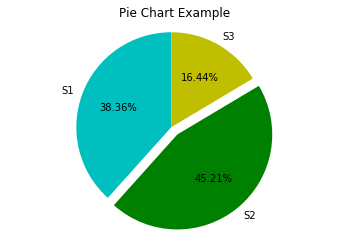

In [ ]:
import matplotlib.pyplot as plt

labels = 'S1', 'S2', 'S3'
sections = [56, 66, 24]
colors = ['c', 'g', 'y']

plt.pie(sections, labels=labels, colors=colors,
        startangle=90,
        explode = (0, 0.1, 0),
        autopct = '%1.2f%%')

plt.axis('equal') # Try commenting this out.
plt.title('Pie Chart Example')
plt.show()

### fill_between and alpha

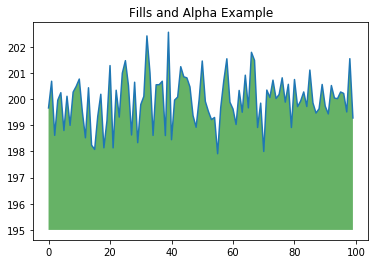

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

ys = 200 + np.random.randn(100)
x = [x for x in range(len(ys))]

plt.plot(x, ys, '-')
plt.fill_between(x, ys, 195, where=(ys > 195), facecolor='g', alpha=0.6)

plt.title("Fills and Alpha Example")
plt.show()

### Subplotting using Subplot2grid

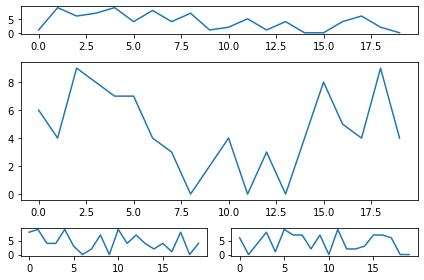

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def random_plots():
  xs = []
  ys = []

  for i in range(20):
    x = i
    y = np.random.randint(10)

    xs.append(x)
    ys.append(y)

  return xs, ys

fig = plt.figure()
ax1 = plt.subplot2grid((5, 2), (0, 0), rowspan=1, colspan=2)
ax2 = plt.subplot2grid((5, 2), (1, 0), rowspan=3, colspan=2)
ax3 = plt.subplot2grid((5, 2), (4, 0), rowspan=1, colspan=1)
ax4 = plt.subplot2grid((5, 2), (4, 1), rowspan=1, colspan=1)

x, y = random_plots()
ax1.plot(x, y)

x, y = random_plots()
ax2.plot(x, y)

x, y = random_plots()

Ah, phew, the headline read like it had just occured after the minerals deal. As usual, clickbait rage bait. They're referring to the first week of Trump's first term when HEgseth was just getting the start of his buzz on. Not after the mineral deal was signed.

ax3.plot(x, y)

x, y = random_plots()
ax4.plot(x, y)

plt.tight_layout()
plt.show()

## Plot styles

Colaboratory charts use [Seaborn's](https://seaborn.pydata.org) custom styling by default. To customize styling further please see the [matplotlib docs](https://matplotlib.org/users/style_sheets.html).

## 3D Graphs

### 3D Scatter Plots

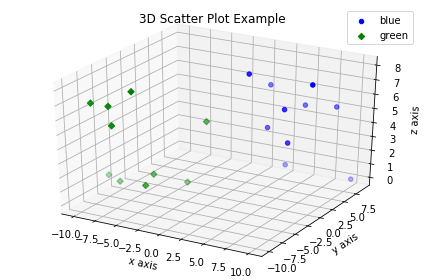

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import axes3d

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x1 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y1 = np.random.randint(10, size=10)
z1 = np.random.randint(10, size=10)

x2 = [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10]
y2 = np.random.randint(-10, 0, size=10)
z2 = np.random.randint(10, size=10)

ax.scatter(x1, y1, z1, c='b', marker='o', label='blue')
ax.scatter(x2, y2, z2, c='g', marker='D', label='green')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Scatter Plot Example")
plt.legend()
plt.tight_layout()
plt.show()

### 3D Bar Plots

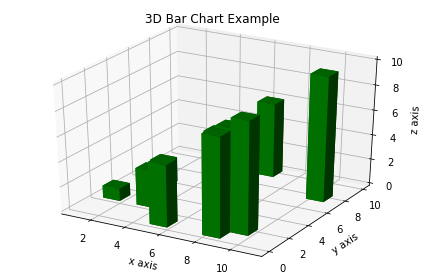

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y = np.random.randint(10, size=10)
z = np.zeros(10)

dx = np.ones(10)
dy = np.ones(10)
dz = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

ax.bar3d(x, y, z, dx, dy, dz, color='g')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Bar Chart Example")
plt.tight_layout()
plt.show()

### Wireframe Plots

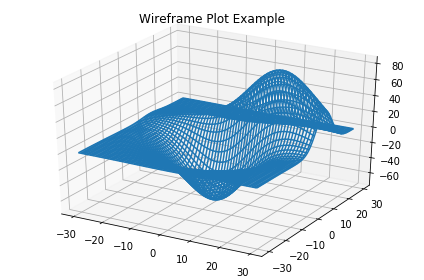

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x, y, z = axes3d.get_test_data()

ax.plot_wireframe(x, y, z, rstride = 2, cstride = 2)

plt.title("Wireframe Plot Example")
plt.tight_layout()
plt.show()

## Seaborn

There are several libraries layered on top of Matplotlib that you can use in Colab. One that is worth highlighting is [Seaborn](http://seaborn.pydata.org):

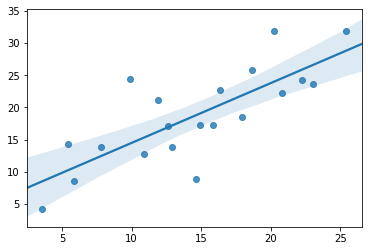

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Generate some random data
num_points = 20
# x will be 5, 6, 7... but also twiddled randomly
x = 5 + np.arange(num_points) + np.random.randn(num_points)
# y will be 10, 11, 12... but twiddled even more randomly
y = 10 + np.arange(num_points) + 5 * np.random.randn(num_points)
sns.regplot(x=x, y=y)
plt.show()

That's a simple scatterplot with a nice regression line fit to it, all with just one call to Seaborn's [regplot](http://seaborn.pydata.org/generated/seaborn.regplot.html#seaborn.regplot).

Here's a Seaborn [heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.html):

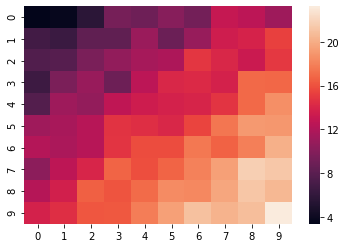

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Make a 10 x 10 heatmap of some random data
side_length = 10
# Start with a 10 x 10 matrix with values randomized around 5
data = 5 + np.random.randn(side_length, side_length)
# The next two lines make the values larger as we get closer to (9, 9)
data += np.arange(side_length)
data += np.reshape(np.arange(side_length), (side_length, 1))
# Generate the heatmap
sns.heatmap(data)
plt.show()

## Altair

[Altair](http://altair-viz.github.io) is a declarative visualization library for creating interactive visualizations in Python, and is installed and enabled in Colab by default.

For example, here is an interactive scatter plot:

In [ ]:
import altair as alt
from vega_datasets import data
cars = data.cars()

alt.Chart(cars).mark_point().encode(
    x='Horsepower',
    y='Miles_per_Gallon',
    color='Origin',
).interactive()

alt.Chart(...)

For more examples of Altair plots, see the [Altair snippets notebook](/notebooks/snippets/altair.ipynb) or the external [Altair Example Gallery](https://altair-viz.github.io/gallery/).

## Plotly

### Sample

In [ ]:
from plotly.offline import iplot
import plotly.graph_objs as go

data = [
    go.Contour(
        z=[[10, 10.625, 12.5, 15.625, 20],
           [5.625, 6.25, 8.125, 11.25, 15.625],
           [2.5, 3.125, 5., 8.125, 12.5],
           [0.625, 1.25, 3.125, 6.25, 10.625],
           [0, 0.625, 2.5, 5.625, 10]]
    )
]
iplot(data)

## Bokeh

### Sample

In [ ]:
import numpy as np
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

# Call once to configure Bokeh to display plots inline in the notebook.
output_notebook()

In [ ]:
N = 4000
x = np.random.random(size=N) * 100
y = np.random.random(size=N) * 100
radii = np.random.random(size=N) * 1.5
colors = ["#%02x%02x%02x" % (r, g, 150) for r, g in zip(np.floor(50+2*x).astype(int), np.floor(30+2*y).astype(int))]

p = figure()
p.circle(x, y, radius=radii, fill_color=colors, fill_alpha=0.6, line_color=None)
show(p)